<a href="https://colab.research.google.com/github/NickKar30/GM-HSE-AI-masters-course/blob/main/homeworks/base/GenDL_HT4_Base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Домашнее задание 4 (base): авторегрессионные модели и мультимодальность

В этом домашнем задании вам предлагается обучить авторегрессионную модель для генерации изображений (PixelCNN), а также сделать подход мультимодальным,  обусловив модель на CLIP-эмбеддинги.

# Рекомендации (sanity check) по обучению модели

1) Обучите вашу модель на выборке из 100 картинок (первые 100 из датасета) + всех возможных кепшенов для них. Модель должна переобучится под эти 100 картинки и выдавать очень низкий bpd и генерить хорошие картинки. Это санити чек для задачи 4 и 5. Оставьте этот ран в ноутбуке, чтобы мы тоже видели (постарайтесь сделать это красиво, не копипастя все клетки ноутбука, а именно конфигурируя эксперимент)

2) Идем на весь датасет, чтобы научиться обобщаться на разные картинки и промпты. Хорошая в рамках дз модель должна научится как минимум рисовать background-ы и иногда показывать очертания птиц. Чтобы птицы (или что-то на них похожее) стали более видны (и cond и uncond), используйте температуру при сэмплировании (подумайте почему это влияет). Будет заметно влиятнее промпта

В задаче можно точно выбить bpd в 8.9 — как ориентир после долгого обучения. 9.8 должно выбиваться довольно быстро.

### Задание 1 (0 баллов)

Скачайте [датасет про птиц с HuggingFace](https://huggingface.co/datasets/weiywang/CUB_200_2011_CAP).

In [1]:
import os
import random
from pathlib import Path
import numpy as np
import pickle
import lpips

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import CLIPProcessor, CLIPModel

# PyTorch Lightning
import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint, EarlyStopping

# Dataset and model
from datasets import load_dataset
from diffusers import VQModel

import matplotlib.pyplot as plt
from PIL import Image
from rich import print as rprint
from tqdm.notebook import tqdm

# Path to the folder where the datasets are/should be downloaded (e.g. MNIST)
DATA_PATH = "./data"
Path(DATA_PATH).mkdir(parents=True, exist_ok=True)
# Path to the folder where the pretrained models are saved
MODEL_PATH = "./models"
Path(MODEL_PATH).mkdir(parents=True, exist_ok=True)

# Если False, но не будут генерирваться изображения и оцениваться модели
SAMPLE_IMAGES = True

# Setting the seed
pl.seed_everything(42)

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = (
    "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
)
os.environ["TOKENIZERS_PARALLELISM"] = "true"
print("Using device", device)

Seed set to 42


Using device cuda


In [2]:
# ваш код здесь
ds = load_dataset("weiywang/CUB_200_2011_CAP", cache_dir="./data")

# Изучаем структуру
print("Сплиты датасета:", list(ds.keys()))  # только 'train'
print("\nСтруктура `train`:\n", ds['train'])
print("\nПример:")
rprint(ds['train'][0])


Сплиты датасета: ['train']

Структура `train`:
 Dataset({
    features: ['image', 'text', 'label'],
    num_rows: 11787
})

Пример:


{
    'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x400 at 0x750AF6B1A900>,
    'text': 'a bird with big eyes and brown tones all over. white underbelly and pointed beaka very small bird 
whose entire coat is covered with varying shades of green.this bird is brown with white on its chest and has a very
short beak.this small bird has grey wingbars with a white belly.this light brown and yellow bird features large 
black eyes and a small beak.small grey green and brown bird with medium black tarsus and medium beakthis bird has 
wings that are green and black and has a white bodythis bird has wings that are black and white and has a green 
headthis bird has wings that are grey and has a white bellythis bird is brown and white in color, and has a brown 
beak.',
    'label': 'Acadian Flycatcher'
}

### UPD: VQ-VAE

VQ-VAE - это автоэнкодер, который позволяет сжимать большие входные изображения в дискретное латентное пространство (последовательность кодов) и декодировать их обратно (см. рис).

<img src="https://substackcdn.com/image/fetch/$s_!dRiM!,f_auto,q_auto:good,fl_progressive:steep/https%3A%2F%2Fsubstack-post-media.s3.amazonaws.com%2Fpublic%2Fimages%2F81630fcc-b23e-4f06-831f-690aff70e03b_1215x476.png" width="800" height="400">

VQ-VAE состоит из трех частей. Энкодер кодирует входное изображение $x \in \mathbb{R}^{B \times C \times H \times W}$ в непрерывное латентное пространство $z_e \in \mathbb{R}^{B \times D \times H_{h} \times W_{h}}$. Quantizer смотрит на каждый вектор из $z_e$ ($H_{h} \times W_{h}$ штук длины $D$) и заменяет их на ближайший похожий вектор из словаря-векторов (codebook), который обучался вместе с моделью. Сам $z_e$после такой операции заменяется на $z_q$ (те же размеры, но каждый вектор заменен на ближайшего из кодбука). $z_q$ можно хранить либо как непрерывный тензор $\mathbb{R}^{B \times D \times H_{h} \times W_{h}}$, либо просто хранить $B \times  H_{h} \times W_{h}$ дискретных индексов из кодбука, где индексы соответствуют номеру вектора в кодбуке (для примера, если у нас 4096 векторов в кодбуке и мы $z_e$ заменили на вектора на местах $1, 2000, 2, 10$ из кодбука, то теперь $z_q$ в дискретном виде это просто массив $1, 200, 2, 10$). Декодер, последняя часть VQ-VAE, берет $z_q$ и переводит из кодов обратно в вектора из кодбука (если $z_q$ был в виде кодов, а не векторов) и прогоняет $z_q$ через набор слоев, чтобы получить изображение $\hat{x} \simeq x$.


$H_{h} \times W_{h}$ как правило сильно меньше оригинальных $H \times W$, поэтому многие генеративные модели используют VQ-VAE для генерации высококачественных изображений без значительного усложнения вычислительной сложности. Действительно, если вместо авторегрессионной генерации $С \times H \times W$, где $H, W \ge 128$ мы будем работать с дискретным тензором $H_{h} \times W_{h}$, где $H_h, W_h \le 32$, то мы сможем генерировать качественные изображения с той же вычислительной сложностью как если бы сделали resize изначальных картинок в $32\times32$, но при этом не теряем в качестве изображений (ведь финальное изображение получается прогоном кодов через декодер).

Давайте посмотрим как это работает:

In [3]:
# Скачаем предобученную VQ-VAE
vqvae = VQModel.from_pretrained("microsoft/vq-diffusion-ithq", subfolder="vqvae", cache_dir="./data")
vqvae.to(device)

An error occurred while trying to fetch microsoft/vq-diffusion-ithq: microsoft/vq-diffusion-ithq does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


VQModel(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 64, eps=1e-06, affine=True)
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 64, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 64, eps=1e-06, affine=True)
            (conv1): Conv2d(64

Скачаем картинку для примера

In [4]:
!wget "https://upload.wikimedia.org/wikipedia/commons/1/16/Myophonus_caeruleus_-_Ang_Khang_edit1.jpg" -O example.jpg

--2025-12-01 22:50:13--  https://upload.wikimedia.org/wikipedia/commons/1/16/Myophonus_caeruleus_-_Ang_Khang_edit1.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 185.15.59.240, 2a02:ec80:300:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|185.15.59.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1474949 (1.4M) [image/jpeg]
Saving to: ‘example.jpg’

example.jpg         100%[===================>]   1.41M  5.28MB/s    in 0.3s    

2025-12-01 22:50:13 (5.28 MB/s) - ‘example.jpg’ saved [1474949/1474949]



In [5]:
img = Image.open("example.jpg")
# img

VQ-VAE этот работает на изображениях $256\times 256$, поэтому ресайзим

In [6]:
# from torchvision import transforms

x = transforms.Resize((256, 256))(img)
x = transforms.ToTensor()(x)
x.shape

torch.Size([3, 256, 256])

Код для получения кодов и декодирования изображения:

In [7]:
def img_to_codes(x, vqvae):
    if x.ndim != 4:
        x = x.unsqueeze(0)
    # для нормализации вход не [0, 1], а [-1, 1]
    x = x * 2 - 1
    # применяем энкодер
    latent = vqvae.encode(x).latents
    # получаем z_q и соответствующие коды
    quant, commit_loss, (_, _, indices) = vqvae.quantize(latent)
    # коды тут flatten, решейпим обратно
    B, _, Hc, Wc = latent.shape
    if indices.dim() == 1:
        codes = indices.view(B, Hc, Wc)
    else:
        codes = indices
    return codes

def codes_to_img(codes, vqvae):
    
    B, Hc, Wc = codes.shape
    codes = codes.view(-1)
    # получаем непрерывное z_q из соответствующих кодов,
    # смотря на вектора из кодбука по индексам
    quant = vqvae.quantize.get_codebook_entry(
        codes,
        shape=(B, Hc, Wc, vqvae.quantize.vq_embed_dim)  # (B, H, W, C)
    )
    # декодируем
    quant2 = vqvae.post_quant_conv(quant)
    dec = vqvae.decoder(quant2, quant if vqvae.config.norm_type == "spatial" else None)
    # Ограничиваем выход декодера диапазоном [-1, 1] перед нормализацией в [0, 1]
    dec = torch.clamp(dec, -1, 1)
    return (dec + 1) / 2

Применим:

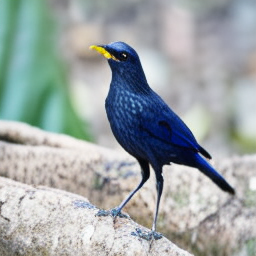

In [8]:
codes = img_to_codes(x.to(device), vqvae)
hat_x = codes_to_img(codes, vqvae)
transforms.ToPILImage()(hat_x[0])

In [9]:
codes

tensor([[[ 817, 2035, 1131,  ..., 2121, 3251,  308],
         [ 959, 3175, 3348,  ...,  798,  890,  626],
         [4008,  485, 1446,  ...,  300, 2945,  113],
         ...,
         [1287, 3999, 2154,  ..., 1070, 2207, 1166],
         [3132, 4010,  896,  ...,  729, 2359, 3617],
         [1282, 1434, 3435,  ...,  312,  109, 1547]]], device='cuda:0')

Видим, что у нас получилось довольно хорошо восстановить изображения из кодов. Но какие размеры у `codes`?

In [10]:
codes.shape

torch.Size([1, 32, 32])

$B=1$, т.е. вместо $3\times 256\times 256$ (RGB) мы получаем всего лишь $32\times 32$.

Раньше, дискретных значений было в одном пикселе было $3 \cdot 256$ (цвета в RGB по каждому каналу). Теперь кол-во дискретных значения задается количеством кодов в кодбуке vqvae $N_q$

In [11]:
vqvae.config.num_vq_embeddings

4096

Как и прежде, мы можем генерировать подобные дискретные тензоры авторегрессионно с помощью PixelCNN, но если раньше мы работали в пространстве изображений, то теперь будем работать в латентном. Как и раньше, мы будем считать, что $32\times32$ тензор это последовательность токенов со значениями из $[0, N_q-1]$, которую мы считываем построчно слево направо. Наш PixelCNN, как и раньше, будет смотреть только на предыдущие токены, чтобы генерировать новый. Модель каждый шаг будет предсказывать вероятностное распределение на словаре: $[0, N_q-1]$

То есть, все буквально, как и раньше, но вместо RGB изображений, мы будем генерировать `codes`. Чтобы получить RGB, мы просто прокинем codes через декодер VQ-VAE и получим RGB изображений в высоком разрешении.

P.S. Поскольку VQ-VAE сильно сжимает изображение, мы заодно избавляемся от высокочастотного шума, который присутствует в цветных натуральных изображениях и мешает авторегрессионным генераторам делать хорошую генерацию. В изначальной версии ДЗ PixelCNN могло получить хороший bpd, но генерировало RGB шум из-за слишком разнообразного фона на картинках птиц. VQ-VAE, засчет сжатия, делает каждый токен очень значимым (нет двух соседних токенов, которые по сути отвечают лишь за две соседние маленькие точки фона, мешая PixelCNN обучиться). Действительно, если изначально картинка была с стороной 256, а стала с 32 в  `codes`, то каждый токен отвечает за участок размера $8\times8$, что куда более значимо, чем один пиксель в исходном изображении. Можно было бы сказать, что такого же эффекта "значимости" можно было бы добиться просто resize в $32\times 32$ RGB картинки, но PixelCNN путался бы из-за цветов (3 канала в RGB, в `codes` нет каналов), а также сами пиксели имели бы лишь поверхностное значение. В VQ-VAE токены смоделированы специально для сжатия и восстановления обратно в $256\times 256$, поэтому каждый токен содержит в себе более глубокую и детальную информацию, чем просто resize-нутый пиксель.

### Задание 2 (1 балл).

Скачайте любую версию предобученного CLIP на ваш вкус, примените текстовый кодировщик к описаниям птиц из датасета (столбец "text") и сохраните получившиеся эмбеддинги.

Возьмите из датасета две картинки с визуально похожими птицами и посчитайте косинусную близость эмбеддингов подписей к этим фото, оцените корректность результата.

In [12]:
# ваш код здесь

# Загружаем модель CLIP
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32", cache_dir=DATA_PATH)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32", use_fast=True, cache_dir=DATA_PATH)
clip_model.to(device)
clip_model.eval()

print(f"Размерность текстовых эмбеддингов: {clip_model.config.text_config.hidden_size}")


Размерность текстовых эмбеддингов: 512


In [ ]:
# Получение эмбеддингов для текстов
print("Получение эмбеддингов для текстов...")
text_embeddings = []
texts_list = []

REBUILD_EMBEDDINGS = False  # Можно перестроить эмбеддинги (34 сек на L4)

if (Path(DATA_PATH) / "clip_text_embeddings.pt").exists() and not REBUILD_EMBEDDINGS:    
    all_embeddings = torch.load(Path(DATA_PATH) / "clip_text_embeddings.pt")
    print(f"Загружены эмбеддинги формы: {all_embeddings.shape}")
else:
    with torch.no_grad():
        # Обрабатываем батчами для эффективности
        batch_size = 32
        for i in tqdm(range(0, len(ds['train']), batch_size)):
            batch_texts = [ds['train'][j]['text'] for j in range(i, min(i + batch_size, len(ds['train'])))]
            texts_list.extend(batch_texts)
            
            # Получаем эмбеддинги
            inputs = clip_processor(text=batch_texts, return_tensors="pt", padding=True, truncation=True)
            inputs = {k: v.to(device) for k, v in inputs.items()}
            text_features = clip_model.get_text_features(**inputs)
            text_embeddings.append(text_features.cpu())

    # Объединяем все эмбеддинги
    all_embeddings = torch.cat(text_embeddings, dim=0)
    print(f"Форма всех эмбеддингов: {all_embeddings.shape}")

    # Сохраняем эмбеддинги
    torch.save(all_embeddings, Path(DATA_PATH) / "clip_text_embeddings.pt")
    print("Эмбеддинги сохранены в clip_text_embeddings.pt")


Получение эмбеддингов для текстов...
Загружены эмбеддинги формы: torch.Size([11787, 512])


Косинусная близость с похожей птицей: 0.9122
Косинусная близость с непохожей птицей: 0.5453


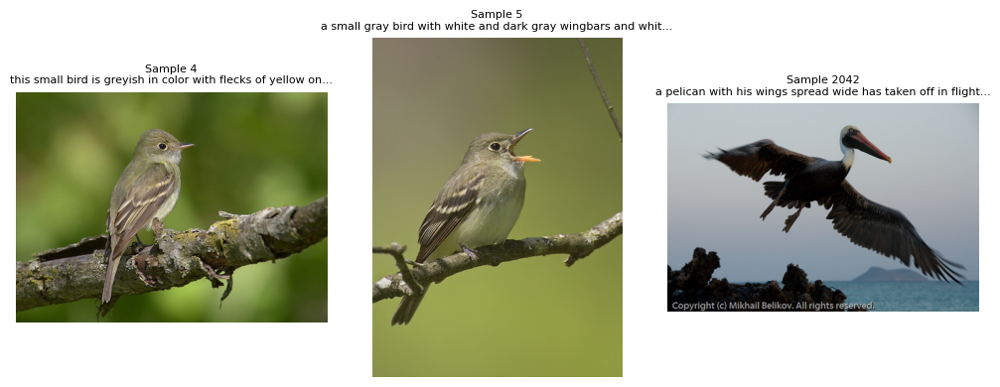

In [14]:
# Косинусная близость похожих птиц

# Глазами нашли похожие птицы - 4 и 5
sim_idx = [4, 5]
sim_txt = [ds['train'][i]['text'] for i in sim_idx]
sim_emb = all_embeddings[sim_idx]

# Для сравнения берем другую птицу
other_idx = 2042
other_txt = ds['train'][other_idx]['text']
other_emb = all_embeddings[other_idx]

cosine_sim = F.cosine_similarity(sim_emb[0].unsqueeze(0), sim_emb[1].unsqueeze(0)).item()
cosine_sim_other = F.cosine_similarity(sim_emb[0].unsqueeze(0), other_emb.unsqueeze(0)).item()
    
print(f"Косинусная близость с похожей птицей: {cosine_sim:.4f}")
print(f"Косинусная близость с непохожей птицей: {cosine_sim_other:.4f}")

# Визуализируем 3 изображения из ds с индексами 4, 5, 2042
fig, axes = plt.subplots(1, 3, figsize=(10, 4))
for i, idx in enumerate(sim_idx + [other_idx]):
    img = ds['train'][idx]['image']
    text = ds['train'][idx]['text']
    axes[i].imshow(img)
    axes[i].set_title(f"Sample {idx}\n{text[:60]}...", fontsize=8)
    axes[i].axis('off')
plt.tight_layout()
plt.show()


### Задание 3 (0.5 балла).

Соберите картинки и получившиеся эмбеддинги в датасеты. Сохраните два датасета: один только с изображениями, другой - с изображениями и эмбеддингами подписей.

- Сконвертируйте картинки в соответствующие `codes` (используйте функции выше)

Hint: внимательно посмотрите на кол-во каналов в изображениях датасета и размеры картинок, предобработайте картинки перед подачей в VQ-VAE

Hint 2: сначала используется сабсет из вашего датасета для дебага, потому что датасет конвертируется долго, после дебага используйте весь

#### Определения функций

In [15]:
# ваш код здесь

# Предобработка изображения
def preprocess_image(img):
    """Предобработка изображения для VQ-VAE"""
    # Конвертируем в RGB если нужно
    if img.mode != 'RGB':
        img = img.convert('RGB')
    # Resize до 256x256
    transform = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor()  # Конвертирует в [0, 1]
    ])
    return transform(img)

# Конвертация изображений в codes
def convert_images_to_codes(dataset, vqvae, device, subset_size=None, save_path=None, rebuild_codes=False) -> torch.Tensor:
    """Конвертирует изображения датасета в codes"""
    if save_path and Path(save_path).exists() and not rebuild_codes:
        print(f"Загружаем codes из {save_path}")
        codes = torch.load(save_path)
        return codes
    
    print("Конвертация изображений в codes...")
    codes_list = []
    
    # Определяем размер подмножества
    total_size = len(dataset)
    if subset_size is None:
        subset_size = total_size
    else:
        subset_size = min(subset_size, total_size)
    
    print(f"Обрабатываем {subset_size} изображений из {total_size}")
    
    vqvae.eval()
    with torch.no_grad():
        for i in tqdm(range(subset_size)):
            try:
                # Получаем изображение
                item = dataset[i]
                if isinstance(item, dict):
                    img = item['image']
                else:
                    img = item
                
                # Предобрабатываем
                img_tensor = preprocess_image(img)
                img_tensor = img_tensor.unsqueeze(0).to(device)  # [1, 3, 256, 256]
                
                # Конвертируем в codes
                codes = img_to_codes(img_tensor, vqvae)
                codes_list.append(codes.cpu())
                
            except Exception as e:
                print(f"Ошибка при обработке изображения {i}: {e}")
                # Создаем пустой codes в случае ошибки
                codes_list.append(torch.zeros((1, 32, 32), dtype=torch.long))
    
    codes = torch.cat(codes_list, dim=0)  # [N, 32, 32]
    print(f"Форма codes: {codes.shape}")
    print(f"Диапазон значений: [{codes.min()}, {codes.max()}]")
    
    if save_path:
        torch.save(codes, save_path)
        print(f"Codes сохранены в {save_path}")
    
    return codes


#### Создание датасетов

In [16]:
if "all_embeddings" not in locals() or all_embeddings is None:
    if (Path(DATA_PATH) / "clip_text_embeddings.pt").exists():
        all_embeddings = torch.load(Path(DATA_PATH) / "clip_text_embeddings.pt")
    else:
        raise AssertionError("all_embeddings не задан. Перезапустите ячейки 'Задание 2'")

print("=" * 50)
print("Подготовка кодированного датасета")
print("=" * 50)

# Конвертируем все в коды (загружается из файла, если он существует)
# Если rebuild_codes=True, переконвертация (2m 35s на NVIDIA L4)
all_codes: torch.Tensor = convert_images_to_codes(
    ds["train"],
    vqvae,
    device,
    subset_size=None,
    save_path=Path(DATA_PATH) / "all_codes.pt",
    rebuild_codes=False,
)

Подготовка кодированного датасета
Загружаем codes из data/all_codes.pt


In [17]:
# Готовим датасеты
ds_codes = torch.utils.data.TensorDataset(all_codes)  # tuple(torch.Tensor,)
ds_codes_emb = torch.utils.data.StackDataset(all_codes, all_embeddings)  # tuple(torch.Tensor, torch.Tensor)

print(f"Полный датасет (только codes): {len(ds_codes)}")
print(f"Полный датасет (codes + embeddings): {len(ds_codes_emb)}")

ds_codes_debug = torch.utils.data.Subset(ds_codes, range(100))
ds_codes_debug_emb = torch.utils.data.Subset(ds_codes_emb, range(100))

print(f"Отладочный датасет (только codes): {len(ds_codes_debug)}")
print(f"Отладочный датасет (codes + embeddings): {len(ds_codes_debug_emb)}")

Полный датасет (только codes): 11787
Полный датасет (codes + embeddings): 11787
Отладочный датасет (только codes): 100
Отладочный датасет (codes + embeddings): 100


### Задание 4 (2 балла).

- Обучите [модель из семинара (PixelCNN)](https://colab.research.google.com/drive/1EIsBxlTcz3ZB0j-ZxN1gWD2dSQq6krPj?usp=sharing) только на `codes` птиц. Модифицируйте размерности тензоров в модели, где это необходимо - чтобы она корректно работала с данными изображениями (обратите внимание на то, какие дискретные числа должны предсказывать ваша модель)

- Сделайте обучаемый `nn.Embedding` для `codes` перед подачей в слои свертки

- Вы можете менять гиперпараметры для улучшения качества генерации

- Выведите на экран 10 сгенерированных картинок, оцените результат, напишите выводы

Hint: добавьте конвертацию кодов в изображения в функцию отрисовки картинок, а не в `sample`.

#### Проверка

In [18]:
# ваш код здесь
assert 'vqvae' in locals() and vqvae is not None, "vqvae не задан. Перезапустите ячейки 'Задание 1' и 'UPD: VQ-VAE'"
num_codes = vqvae.config.num_vq_embeddings

assert 'ds_codes' in locals() and ds_codes is not None, "ds_codes не задан. Перезапустите ячейки 'Задание 3'"
assert 'ds_codes_debug' in locals() and ds_codes_debug is not None, "ds_codes_debug не задан. Перезапустите ячейки 'Задание 3'"

#### Реализация Gated PixelCNN для кодов

In [19]:
# Маскированные свёртки
class MaskedConvolution(nn.Module):
    def __init__(self, c_in, c_out, mask, **kwargs):
        super().__init__()
        kernel_size = (mask.shape[0], mask.shape[1])
        dilation = 1 if "dilation" not in kwargs else kwargs["dilation"]
        padding = tuple([dilation*(kernel_size[i]-1)//2 for i in range(2)])
        self.conv = nn.Conv2d(c_in, c_out, kernel_size, padding=padding, **kwargs)
        self.register_buffer('mask', mask[None,None])

    def forward(self, x):
        self.conv.weight.data *= self.mask
        return self.conv(x)

class VerticalStackConvolution(MaskedConvolution):
    def __init__(self, c_in, c_out, kernel_size=3, mask_center=False, **kwargs):
        mask = torch.ones(kernel_size, kernel_size)
        mask[kernel_size//2+1:,:] = 0
        if mask_center:
            mask[kernel_size//2,:] = 0
        super().__init__(c_in, c_out, mask, **kwargs)

class HorizontalStackConvolution(MaskedConvolution):
    def __init__(self, c_in, c_out, kernel_size=3, mask_center=False, **kwargs):
        mask = torch.ones(1,kernel_size)
        mask[0,kernel_size//2+1:] = 0
        if mask_center:
            mask[0,kernel_size//2] = 0
        super().__init__(c_in, c_out, mask, **kwargs)

# Gated Convolution блок
class GatedMaskedConv(nn.Module):
    def __init__(self, c_in, **kwargs):
        super().__init__()
        self.conv_vert = VerticalStackConvolution(c_in, c_out=2*c_in, **kwargs)
        self.conv_horiz = HorizontalStackConvolution(c_in, c_out=2*c_in, **kwargs)
        self.conv_vert_to_horiz = nn.Conv2d(2*c_in, 2*c_in, kernel_size=1, padding=0)
        self.conv_horiz_1x1 = nn.Conv2d(c_in, c_in, kernel_size=1, padding=0)

    def forward(self, v_stack, h_stack):
        # Vertical stack
        v_stack_feat = self.conv_vert(v_stack)
        v_val, v_gate = v_stack_feat.chunk(2, dim=1)
        v_stack_out = torch.tanh(v_val) * torch.sigmoid(v_gate)

        # Horizontal stack
        h_stack_feat = self.conv_horiz(h_stack)
        h_stack_feat = h_stack_feat + self.conv_vert_to_horiz(v_stack_feat)
        h_val, h_gate = h_stack_feat.chunk(2, dim=1)
        h_stack_feat = torch.tanh(h_val) * torch.sigmoid(h_gate)
        h_stack_out = self.conv_horiz_1x1(h_stack_feat)
        h_stack_out = h_stack_out + h_stack

        return v_stack_out, h_stack_out


In [20]:
# PixelCNN для codes с embedding слоем
class CodesPixelCNN(pl.LightningModule):
    def __init__(self, num_embeddings=4096, embedding_dim=64, c_hidden=128):
        super().__init__()
        self.save_hyperparameters()

        self.num_embeddings = num_embeddings
        self.embedding_dim = embedding_dim

        # Embedding слой для codes
        self.embedding = nn.Embedding(num_embeddings, embedding_dim)
        # nn.init.normal_(self.embedding.weight, 0.0, 0.02)  # ???

        # Initial convolutions skipping the center pixel
        self.conv_vstack = VerticalStackConvolution(embedding_dim, c_hidden, mask_center=True)
        self.conv_hstack = HorizontalStackConvolution(embedding_dim, c_hidden, mask_center=True)
        # Convolution block of PixelCNN. We use dilation instead of downscaling
        self.conv_layers = nn.ModuleList([
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=4),
            GatedMaskedConv(c_hidden),
            GatedMaskedConv(c_hidden, dilation=2),
            GatedMaskedConv(c_hidden)
        ])

        # Output classification convolution (4096 классов вместо 256)
        self.conv_out = nn.Conv2d(c_hidden, num_embeddings, kernel_size=1, padding=0)

    def forward(self, x):
        # x: [B, H, W] - индексы codes (0-4095)

        x_emb = self.embedding(x)  # [B, H, W, embedding_dim] после embedding
        x_emb = x_emb.permute(0, 3, 1, 2)  # [B, embedding_dim, H, W] - для сверток

        # Initial convolutions
        v_stack = self.conv_vstack(x_emb)
        h_stack = self.conv_hstack(x_emb)
        # Gated Convolutions
        for layer in self.conv_layers:
            v_stack, h_stack = layer(v_stack, h_stack)

        # Output: предсказание вероятностей для каждого из 4096 кодов
        logits = self.conv_out(F.elu(h_stack))  # [B, num_embeddings, H, W]

        return logits

    def calc_likelihood(self, x):
        # Forward pass with bpd likelihood calculation
        pred = self.forward(x)
        nll = F.cross_entropy(pred, x, reduction='none')  # [B, H, W]
        bpd = nll.mean(dim=[1,2]) * np.log2(np.exp(1))
        return bpd.mean()

    @torch.no_grad()
    def sample(self, shape=(32, 32), num_samples=1, temperature=1.0):
         # Генерация codes пиксель за пикселем
        # Получаем устройство модели
        device = next(self.parameters()).device
        codes = torch.zeros((num_samples, *shape), dtype=torch.long, device=device)

        for h in range(shape[0]):
            for w in range(shape[1]):
                pred = self.forward(codes[:,:h+1,:])  # [B, num_embeddings, H, W]
                pred_at_pixel = pred[:, :, h, w] / temperature
                probs = F.softmax(pred_at_pixel, dim=-1)  # [B, num_embeddings]
                codes[:, h, w] = torch.multinomial(probs, 1).squeeze(-1)

        return codes

    def configure_optimizers(self):
        # scheduler = optim.lr_scheduler.StepLR(optimizer, 10, gamma=0.95)
        optimizer = optim.Adam(self.parameters(), lr=1e-3)
        scheduler = optim.lr_scheduler.StepLR(optimizer, 1, gamma=0.99)
        return [optimizer], [scheduler]

    def training_step(self, batch, batch_idx):
        loss = self.calc_likelihood(batch[0])
        self.log('train_bpd', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        loss = self.calc_likelihood(batch[0])
        self.log('val_bpd', loss)

    def test_step(self, batch, batch_idx):
        loss = self.calc_likelihood(batch[0])
        self.log('test_bpd', loss)


#### Функции обучения и визуализации

In [21]:
def train_model(model_class, train_loader, val_loader, test_loader, epochs=50, model_name=None, **kwargs):
    """Универсальная функция для обучения модели PixelCNN с PyTorch Lightning

    Args:
        model_class: Класс модели (CodesPixelCNN или ConditionalPixelCNN)
        train_loader: DataLoader для обучения
        val_loader: DataLoader для валидации
        test_loader: DataLoader для тестирования
        epochs: Количество эпох обучения
        model_name: Имя модели (если None, будет использовано имя класса)
        **kwargs: Дополнительные аргументы для конструктора модели

    Returns:
        model: Обученная модель
        result: Результаты обучения (словарь с test и val результатами)
    """
    if model_name is None:
        model_name = model_class.__name__

    mpath = Path(MODEL_PATH) / model_name
    if not mpath.exists():
        mpath.mkdir(parents=True, exist_ok=True)

    trainer = pl.Trainer(
        default_root_dir=mpath,
        accelerator="gpu",
        devices=1,
        max_epochs=epochs,
        callbacks=[
            ModelCheckpoint(save_last=True, save_weights_only=True, mode="min", monitor="val_bpd"),
            LearningRateMonitor("epoch"),
        ],
    )
    result = None
    ckpt_fname = mpath / f"{model_name}.ckpt"
    if ckpt_fname.exists():
        print("Found pretrained model, loading...")
        model = model_class.load_from_checkpoint(ckpt_fname)
    else:
        model = model_class(**kwargs)
        trainer.fit(model, train_loader, val_loader)

    # Test best model on validation and test set
    val_result = trainer.test(model, val_loader, verbose=False)
    test_result = trainer.test(model, test_loader, verbose=False)
    result = {"test": test_result, "val": val_result}

    return model, result


# Функция для визуализации сгенерированных изображений
def visualize_generated_codes(model, vqvae, num_samples=10, temperature=1.0, device="cuda"):
    """Генерирует codes и декодирует их в изображения для визуализации"""
    model = model.to(device)
    vqvae = vqvae.to(device)
    model.eval()

    # Генерируем codes
    with torch.no_grad():
        codes = model.sample(
            shape=(32, 32), num_samples=num_samples, temperature=temperature
        )
        # Декодируем в изображения
        images = codes_to_img(codes, vqvae)  # [num_samples, 3, 256, 256]

    # Визуализация
    num_rows = num_samples // 4 + (0 if num_samples % 4 == 0 else 1)
    fig, axes = plt.subplots(num_rows, 4, figsize=(15, 6 * num_rows))
    axes = axes.flatten()

    for i in range(num_samples):
        img = transforms.ToPILImage()(images[i].cpu())
        # img = images[i].cpu().permute(1, 2, 0)
        axes[i].imshow(img)
        axes[i].set_title(f"Sample {i + 1}")
        axes[i].axis("off")

    plt.tight_layout()
    plt.show()

    return images


#### Обучение отладочной модели

In [22]:
pl.seed_everything(42)
# train_set, val_set = torch.utils.data.random_split(ds_codes_debug, [0.9, 0.1])

dataloaders = [
    DataLoader(ds_codes_debug, batch_size=8, shuffle=False),
    DataLoader(ds_codes_debug, batch_size=8, shuffle=False),
    DataLoader(ds_codes_debug, batch_size=8, shuffle=False),
]

model_dbg, result_dbg = train_model(CodesPixelCNN, *dataloaders, model_name="dbg", epochs=100)
test_res = result_dbg["test"][0]
print(
    "Test bits per dimension: %4.3fbpd"
    % (test_res["test_loss"] if "test_loss" in test_res else test_res["test_bpd"])
)

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
/home/yc-user/GM-HSE-AI-masters-course/.venv/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/logger_connector/logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
/home/yc-user/GM-HSE-AI-masters-course/.venv/lib/python3.12/site-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, 

Found pretrained model, loading...


/home/yc-user/GM-HSE-AI-masters-course/.venv/lib/python3.12/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:433: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=27` in the `DataLoader` to improve performance.


Testing: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

Test bits per dimension: 0.029bpd


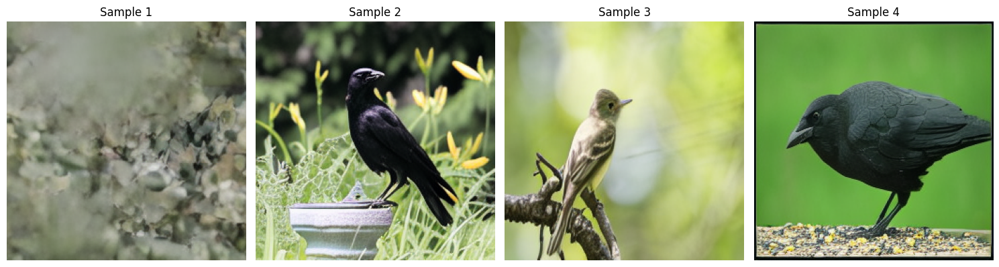

In [23]:
# Генерация изображений для демонстрации

if SAMPLE_IMAGES:
    model_dbg.to(device)
    generated_images = visualize_generated_codes(
        model_dbg, vqvae, num_samples=4, temperature=0.5
    )
else:
    print("Генерация изображений отключена")


In [24]:
del model_dbg

#### Обучение модели на всех данных

In [ ]:
pl.seed_everything(42)
train_set, val_set = torch.utils.data.random_split(ds_codes, [0.8, 0.2])

dataloaders = [
    DataLoader(train_set, batch_size=16, shuffle=True, num_workers=2, pin_memory=True, drop_last=True),  # train
    DataLoader(val_set, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),  # val
    DataLoader(train_set, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),  # test
]

# Если задано model_name, и есть файл с именем "MODEL_PATH/{model_name}/{model_name}.ckpt" то загружается модель из файла
model_full, result_full = train_model(CodesPixelCNN, *dataloaders, epochs=100, model_name="full")

assert model_full is not None, "Модели нет"

test_res = result_full["test"][0]
print(
    "Test bits per dimension: %4.3fbpd"
    % (test_res["test_loss"] if "test_loss" in test_res else test_res["test_bpd"])
)

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model, loading...


Testing: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

Test bits per dimension: 9.342bpd


Генерация изображений...
Temperature: 0.78


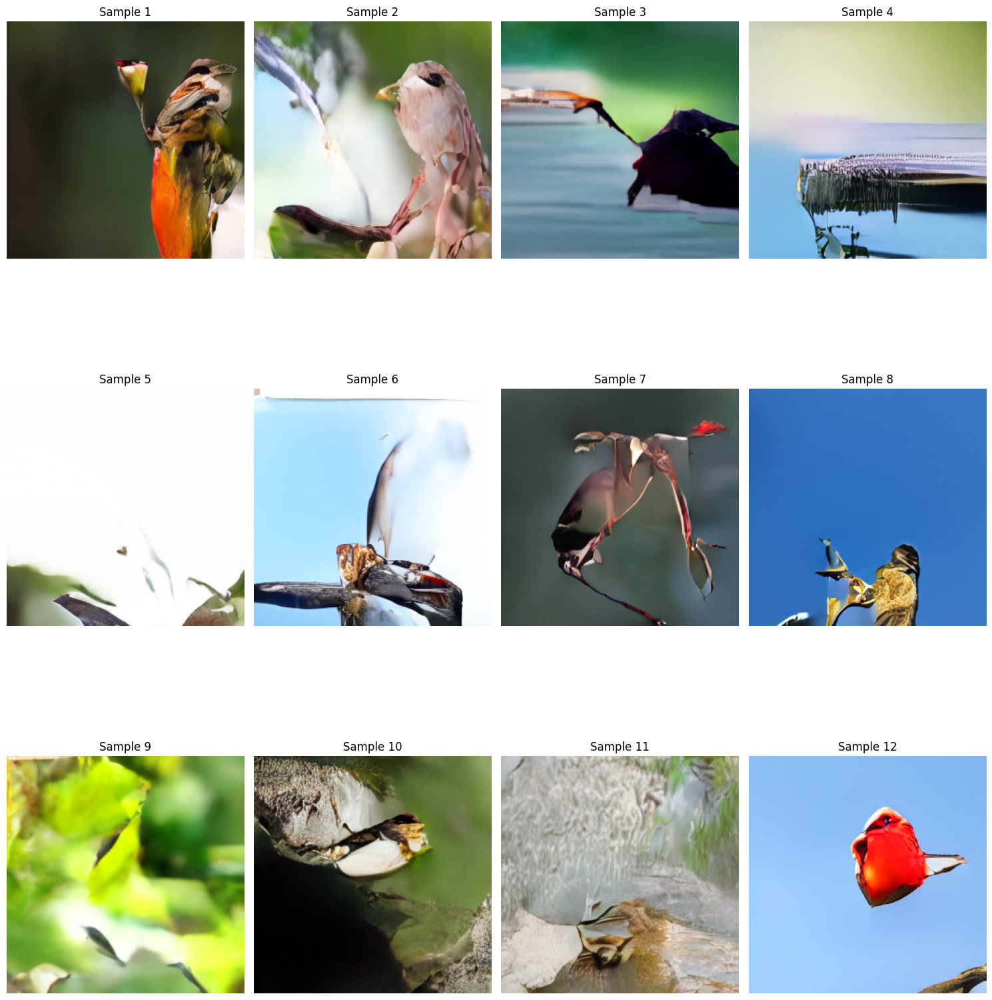

In [26]:
# Генерация изображений для демонстрации
if SAMPLE_IMAGES:
    print("Генерация изображений...")
    for t in [0.78]:
        print(f"Temperature: {t}")
        generated_images = visualize_generated_codes(
            model_full, vqvae, num_samples=12, temperature=t, device=device
        )
else:
    print("Генерация изображений отключена")


Какие-то очертания птиц имеются.

### Задание 5 (3.5 балла).

- Добавьте сохраненные эмбеддинги подписей к архитектуре PixelCNN (это можно сделать любым способом - прибавить эмбеддинги, сконкатенировать их, использовать cross-attention или любой другой подход).

- Обучите такую conditional-модель на птицах и эмбеддингах текстов, выведите на экран по 10 промптам, похожим по формату на промпты из трейна, сгенерированные картинки. Оцените результат, напишите выводы (здесь вы тоже можете менять гиперпараметры модели)

**Hint:** для улучшения качества в последующих заданиях можете прочитать сначала условие задания 6

In [ ]:
# ConditionalPixelCNN, унаследованный от CodesPixelCNN
class ConditionalPixelCNN(CodesPixelCNN):
    def __init__(self, num_embeddings=4096, embedding_dim=64, c_hidden=128, condition_dim=512):
        # Вызываем конструктор базового класса
        super().__init__(num_embeddings=num_embeddings, 
                        embedding_dim=embedding_dim, 
                        c_hidden=c_hidden)
        
        # Добавляем только специфичные для conditional части
        self.condition_dim = condition_dim
        self.condition_proj = nn.Linear(condition_dim, c_hidden)

    def forward(self, x, condition=None):
        # x: [B, H, W] - индексы codes (0-4095)
        # condition: [B, condition_dim] - условие (опционально)

        # Используем embedding из базового класса
        x_emb = self.embedding(x)  # [B, H, W, embedding_dim] после embedding
        x_emb = x_emb.permute(0, 3, 1, 2)  # [B, embedding_dim, H, W] - для сверток

        # Подготовка condition (если передан)
        if condition is not None:
            cond_proj = self.condition_proj(condition)
            cond_proj = cond_proj.unsqueeze(-1).unsqueeze(-1)  # [B, c_hidden, 1, 1]
            cond_proj = cond_proj.expand(-1, -1, x_emb.size(2), x_emb.size(3))  # расширение по H и W

        # Initial convolutions (используем из базового класса)
        v_stack = self.conv_vstack(x_emb)
        h_stack = self.conv_hstack(x_emb)

        # Добавляем condition к initial stacks
        if condition is not None:
            v_stack = v_stack + cond_proj
            h_stack = h_stack + cond_proj

        # Gated Convolutions (используем из базового класса)
        for layer in self.conv_layers:
            v_stack, h_stack = layer(v_stack, h_stack)
            # Добавляем condition после каждого слоя
            if condition is not None:
                v_stack = v_stack + cond_proj
                h_stack = h_stack + cond_proj

        # Output (используем из базового класса)
        logits = self.conv_out(F.elu(h_stack))  # [B, num_embeddings, H, W]

        return logits 

    def calc_likelihood(self, x, condition=None):
        """Вычисление likelihood с поддержкой condition"""
        pred = self.forward(x, condition=condition)
        nll = F.cross_entropy(pred, x, reduction='none')  # [B, H, W]

        # Переписал формулу для bpd. Кажется так более корректно.
        nll_per_image = nll.sum(dim=[1,2])  # [B]
        D = x.shape[1] * x.shape[2]  # число пикселей в изображении
        bpd = nll_per_image / (D * np.log(2.0))  # [B] - bits per dimension

        return bpd.mean()

    @torch.no_grad()
    def sample(self, shape=(32, 32), num_samples=1, temperature=1.0, condition=None):
        """Генерация codes с поддержкой condition"""
        device = next(self.parameters()).device
        codes = torch.zeros((num_samples, *shape), dtype=torch.long, device=device)
        
        # Обработка condition для sample
        if condition is not None:
            if condition.ndim == 1:
                condition = condition.unsqueeze(0).expand(num_samples, -1)
            elif condition.ndim == 2 and condition.shape[0] == 1 and num_samples > 1:
                condition = condition.expand(num_samples, -1)

            assert (
                condition.ndim == 2
                and condition.shape[0] == num_samples
                and condition.shape[1] == self.condition_dim
            ), f"Condition must be [{num_samples}, {self.condition_dim}], now: {str(condition.shape)}"
            condition = condition.to(device)

        for h in range(shape[0]):
            for w in range(shape[1]):
                pred = self.forward(codes[:,:h+1,:], condition=condition)
                pred_at_pixel = pred[:, :, h, w] / temperature
                probs = F.softmax(pred_at_pixel, dim=-1)  # [B, num_embeddings]
                codes[:, h, w] = torch.multinomial(probs, 1).squeeze(-1)

        return codes

    def training_step(self, batch, batch_idx):
        # Переопределяем для работы с парами (codes, embedding)
        codes, embedding = batch   # tuple(tensor_codes, tensor_embedding)
        loss = self.calc_likelihood(codes, condition=embedding)
        self.log('train_bpd', loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        # Переопределяем для работы с парами (codes, embedding)
        codes, embedding = batch   # tuple(tensor_codes, tensor_embedding)
        loss = self.calc_likelihood(codes, condition=embedding)
        self.log('val_bpd', loss)

    def test_step(self, batch, batch_idx):
        # Переопределяем для работы с парами (codes, embedding)
        codes, embedding = batch   # tuple(tensor_codes, tensor_embedding)
        loss = self.calc_likelihood(codes, condition=embedding)
        self.log('test_bpd', loss)

In [ ]:
# Функции для обучения и генерации

# Функция для конвертации текста в CLIP эмбеддинг
@torch.no_grad()
def text_to_embedding(text, clip_model, clip_processor, device):
    """Конвертирует текст в CLIP эмбеддинг"""
    if len(text) == 0:
        text = None
    inputs = clip_processor(text=text, return_tensors="pt", padding=True, truncation=True)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    text_features = clip_model.get_text_features(**inputs).to(device)
    return text_features

# Функция для генерации изображений по списку промптов
@torch.inference_mode()
def generate_images_from_prompts(prompts, model, vqvae, clip_model, clip_processor, 
                               num_samples_per_prompt=1, temperature=0.8, device=device):
    """Генерирует изображения по списку текстовых промптов"""

    model.eval()
    vqvae.eval()
    
    all_images = []
    all_codes = []
    if len(prompts) == 0:
        # Unconditional generation
        codes = model.sample(
            shape=(32, 32), 
            num_samples=num_samples_per_prompt, 
            condition=None,
            temperature=temperature, 
        )
        
        # Конвертируем codes в изображения
        images = codes_to_img(codes, vqvae)  # [num_samples, 3, 256, 256]
        
        # Перемещаем на CPU для освобождения памяти GPU
        images = images.cpu()
        codes = codes.cpu()
        
        all_images.append(images)
        all_codes.append(codes)
        
        # Очистка памяти
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    for prompt in prompts:
        # Получаем эмбеддинг для промпта
        text_emb = text_to_embedding([prompt], clip_model, clip_processor, device)
        
        # Генерируем codes
        codes = model.sample(
            shape=(32, 32), 
            num_samples=num_samples_per_prompt, 
            condition=text_emb,
            temperature=temperature, 
        )
        
        # Конвертируем codes в изображения
        images = codes_to_img(codes, vqvae)  # [num_samples, 3, 256, 256]
        
        # Перемещаем на CPU для освобождения памяти GPU
        images = images.cpu()
        codes = codes.cpu()
        
        all_images.append(images)
        all_codes.append(codes)
        
        # Очистка промежуточных переменных после каждой генерации
        # (не удаляем codes и images, так как они уже в списках)
        del text_emb
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
    
    return all_images, all_codes


# Функция для визуализации сгенерированных изображений
def visualize_generated_images(images_list, prompts, num_cols=5):

    num_prompts = len(prompts)
    num_samples = len(images_list[0])

    if num_prompts == 0:
        num_prompts = 1
        prompts = ["Unconditional generation"]

    # увеличиваем вертикальные интервалы между строками
    fig, axes = plt.subplots(
        num_prompts,
        num_cols,
        figsize=(4 * num_cols, 4 * num_prompts),
        gridspec_kw=dict(hspace=0.3)   
    )
    if num_prompts == 1:
        axes = axes.reshape(1, -1)

    for i, (images, prompt) in enumerate(zip(images_list, prompts)):
        for j in range(min(num_cols, num_samples)):
            img = transforms.ToPILImage()(images[j].cpu())
            ax = axes[i, j]
            ax.imshow(img)
            ax.set_title(f"Sample {j+1}", fontsize=8)
            ax.axis("off")

        for j in range(num_samples, num_cols):
            axes[i, j].axis("off")

    # Вызываем tight_layout перед позиционированием текста, чтобы координаты осей были актуальными
    plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])
    
    # Позиционируем текст после tight_layout с актуальными координатами осей
    for i, (images, prompt) in enumerate(zip(images_list, prompts)):
        # Используем координаты первой оси в строке для точного позиционирования
        first_ax = axes[i, 0]
        # Получаем верхнюю границу оси в координатах фигуры
        bbox = first_ax.get_position()
        y_pos = bbox.y1 + 0.02  # немного выше верхней границы оси
        fig.text(
            0.5,
            y_pos,
            f"Prompt: {prompt[:80]}",
            ha="center",
            va="bottom",
            fontsize=11,
        )
    
    plt.show()

#### Проверка на тестовом датасете

In [29]:
# Обучение
assert "vqvae" in locals() and vqvae is not None, "vqvae не задан"
assert "ds_codes_emb" in locals() and ds_codes_emb is not None, "ds_codes_emb не задан"
assert "clip_model" in locals() and clip_model is not None, "clip_model не задан"
assert "clip_processor" in locals() and clip_processor is not None, "clip_processor не задан"

cond_dataloaders = [
    DataLoader(ds_codes_debug_emb, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),
    DataLoader(ds_codes_debug_emb, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),  # test
    DataLoader(ds_codes_debug_emb, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),  # val
]
model_cb, result_cb = train_model(
    ConditionalPixelCNN,
    *cond_dataloaders,
    model_name="cond_dbg",
    epochs=150,
    c_hidden=256,
    condition_dim=512,
)

test_res = result_cb["test"][0]
print(
    "Test bits per dimension: %4.3fbpd"
    % (test_res["test_loss"] if "test_loss" in test_res else test_res["test_bpd"])
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model, loading...


Testing: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

Test bits per dimension: 0.011bpd


/tmp/ipykernel_85739/2670823425.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])


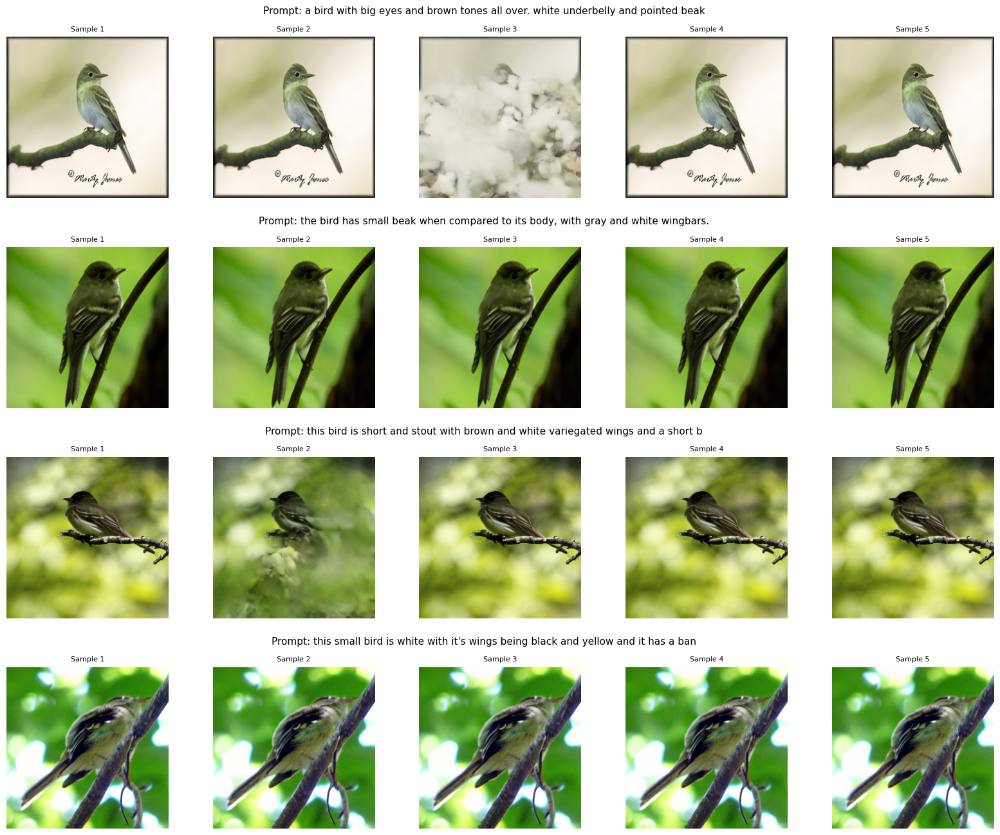

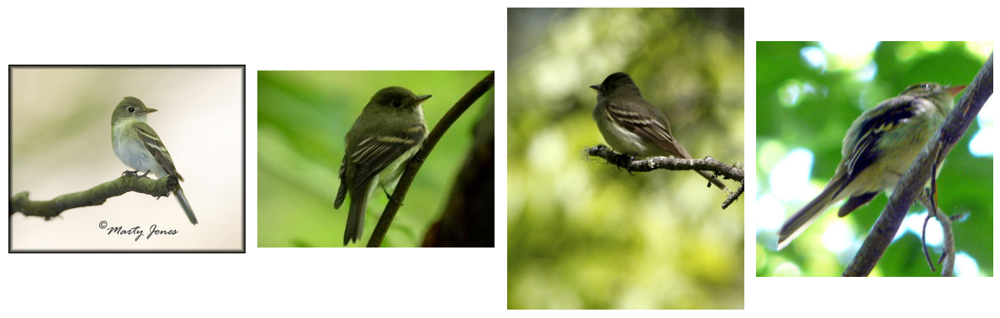

In [30]:
# Используем первые 3 промпта из датасета 
# (они точно есть в отладочном датасете)
prompts = ds['train']['text'][0:4]

if SAMPLE_IMAGES:
   vqvae = vqvae.eval().to(device)
   clip_model = clip_model.eval().to(device)
   model_cb = model_cb.eval().to(device)

   dbg_images, dbg_codes = generate_images_from_prompts(prompts, model_cb, vqvae, clip_model, clip_processor, 
                                 num_samples_per_prompt=5, temperature=0.6, device=device)

   visualize_generated_images(dbg_images, prompts, num_cols=5)

# Для сравнения - реальные изображения с номерами 0, 1, 2 из датасета
if SAMPLE_IMAGES:
    img = ds['train']['image'][:4]
    fig, axs = plt.subplots(1, 4, figsize=(12, 4))
    for i in range(4):
        axs[i].imshow(img[i])
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

Последняя строка изображений - оригиналы из датасета

#### Обучение на полном датасете

In [31]:
# Обучение
assert "vqvae" in locals() and vqvae is not None, "vqvae не задан"
assert "ds_codes_emb" in locals() and ds_codes_emb is not None, "ds_codes_emb не задан"
assert "clip_model" in locals() and clip_model is not None, "clip_model не задан"
assert "clip_processor" in locals() and clip_processor is not None, "clip_processor не задан"

# Создание DataLoader'ов
train_set, val_set = torch.utils.data.random_split(ds_codes_emb, [0.9, 0.1])
cond_dataloaders = [
    DataLoader(train_set, batch_size=8, shuffle=True, num_workers=2, pin_memory=True, drop_last=True),
    DataLoader(val_set, batch_size=8, shuffle=False, num_workers=2, pin_memory=True),  # val
    DataLoader(train_set, batch_size=8, shuffle=False, num_workers=2, pin_memory=True),  # test
]
model_cf, result_cf = train_model(
    ConditionalPixelCNN,
    *cond_dataloaders,
    model_name="cond_full",
    epochs=200,
    c_hidden=256,
    condition_dim=512,
)

test_res = result_cf["test"][0]
print(
    "Test bits per dimension: %4.3fbpd"
    % (test_res["test_loss"] if "test_loss" in test_res else test_res["test_bpd"])
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model, loading...


Testing: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

Test bits per dimension: 9.613bpd


/tmp/ipykernel_85739/2670823425.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])


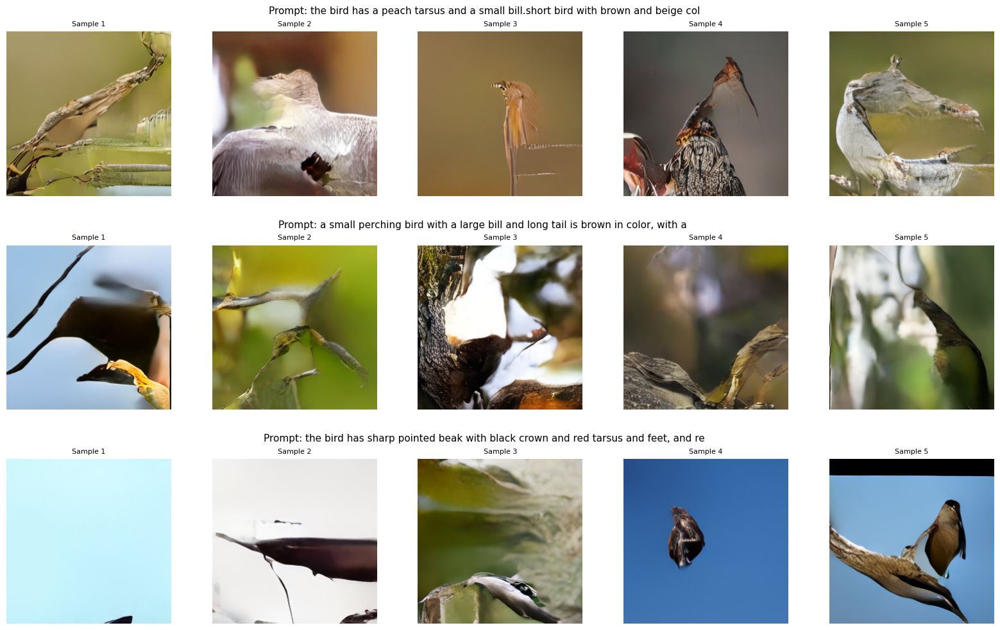

In [ ]:
if SAMPLE_IMAGES:
    random_indices = random.sample(range(len(ds['train'])), 3)
    prompts = [ds['train']['text'][i] for i in random_indices]

    vqvae = vqvae.eval().to(device)
    clip_model = clip_model.eval().to(device)
    model_cf = model_cf.eval().to(device)

    images_cf, codes_cf = generate_images_from_prompts(prompts, model_cf, vqvae, clip_model, clip_processor, 
                                num_samples_per_prompt=5, temperature=0.8, device=device)

    visualize_generated_images(images_cf, prompts, num_cols=5)


Сравним с оригиналами

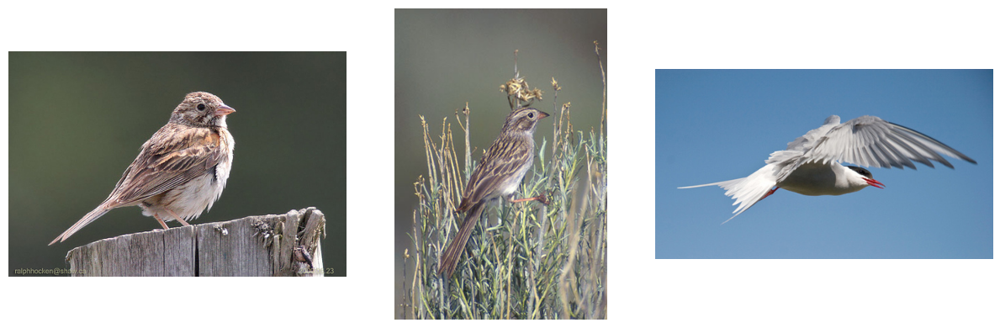

In [33]:
if SAMPLE_IMAGES:
    # и оригинальные изображения с теми же номерами
    fig, axs = plt.subplots(1, len(random_indices), figsize=(12, 4))
    for i, idx in enumerate(random_indices):
        axs[i].imshow(ds['train']['image'][idx])
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

### Задание 6 (0.5 балла).

Добавьте [classifier-free guidance](https://colab.research.google.com/drive/1EIsBxlTcz3ZB0j-ZxN1gWD2dSQq6krPj?usp=sharing) на этапе инференса для увеличения разнообразия генерации. Проведите несколько экспериментов.

Для улучшения качества и разнообразия генерации (опционально) можно добавить [classifier-free guidance и на этапе обучения](https://education.yandex.ru/handbook/ml/article/diffuzionnye-modeli):
- для этого во время обучения эмбеддинг промпта заменяется с какой-то фиксированной вероятностью (например, 10%) на эмбеддинг пустого промпта



In [34]:
# CFGConditionalPixelCNN, унаследованный от ConditionalPixelCNN
class CFGConditionalPixelCNN(ConditionalPixelCNN):
    def __init__(self, num_embeddings=4096, embedding_dim=64, c_hidden=128, 
                 condition_dim=512, cfg_dropout_prob=0.1):
        # Вызываем конструктор базового класса
        super().__init__(
            num_embeddings=num_embeddings,
            embedding_dim=embedding_dim,
            c_hidden=c_hidden,
            condition_dim=condition_dim
        )
        
        # Вероятность обнуления промпта (CFG)
        self.cfg_dropout_prob = cfg_dropout_prob

        self.save_hyperparameters()

    def training_step(self, batch, batch_idx):
        """Переопределяем для добавления CFG dropout"""
        codes, embedding = batch   # tuple(tensor_codes, tensor_embedding)
        
        # Classifier-free guidance: с вероятностью cfg_dropout_prob обнуляем эмбеддинг промпта
        if self.training and self.cfg_dropout_prob > 0:
            # Создаем маску для батча: True - нужно обнулить промпт
            batch_size = embedding.shape[0]
            dropout_mask = torch.rand(batch_size, device=embedding.device) < self.cfg_dropout_prob
            
            # Создаем пустой промпт (нулевой эмбеддинг)
            empty_embedding = torch.zeros_like(embedding)
            
            # Обнуляем эмбеддинги по маске
            embedding = torch.where(
                dropout_mask.unsqueeze(-1),
                empty_embedding,
                embedding
            )
        
        # Используем метод calc_likelihood из базового класса
        loss = self.calc_likelihood(codes, condition=embedding)
        self.log('train_bpd', loss, prog_bar=True)
        return loss

#### Проверка на тестовом датасете

In [35]:
# Обучение
assert "vqvae" in locals() and vqvae is not None, "vqvae не задан"
assert "ds_codes_emb" in locals() and ds_codes_emb is not None, "ds_codes_emb не задан"
assert "ds_codes_debug_emb" in locals() and ds_codes_debug_emb is not None, "ds_codes_debug_emb не задан"
assert "clip_model" in locals() and clip_model is not None, "clip_model не задан"
assert "clip_processor" in locals() and clip_processor is not None, "clip_processor не задан"

cond_dataloaders = [
    DataLoader(ds_codes_debug_emb, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),
    DataLoader(ds_codes_debug_emb, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),  # test
    DataLoader(ds_codes_debug_emb, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),  # val
]
model_cfg_dbg, result_cfg_dbg = train_model(
    CFGConditionalPixelCNN,
    *cond_dataloaders,
    model_name="cfg_dbg",
    epochs=100,
    c_hidden=256,
    condition_dim=512,
    cfg_dropout_prob=0.1,
)

test_res = result_cfg_dbg["test"][0]
print(
    "Test bits per dimension: %4.3fbpd"
    % (test_res["test_loss"] if "test_loss" in test_res else test_res["test_bpd"])
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model, loading...


Testing: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

Test bits per dimension: 0.016bpd


/tmp/ipykernel_85739/2670823425.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])


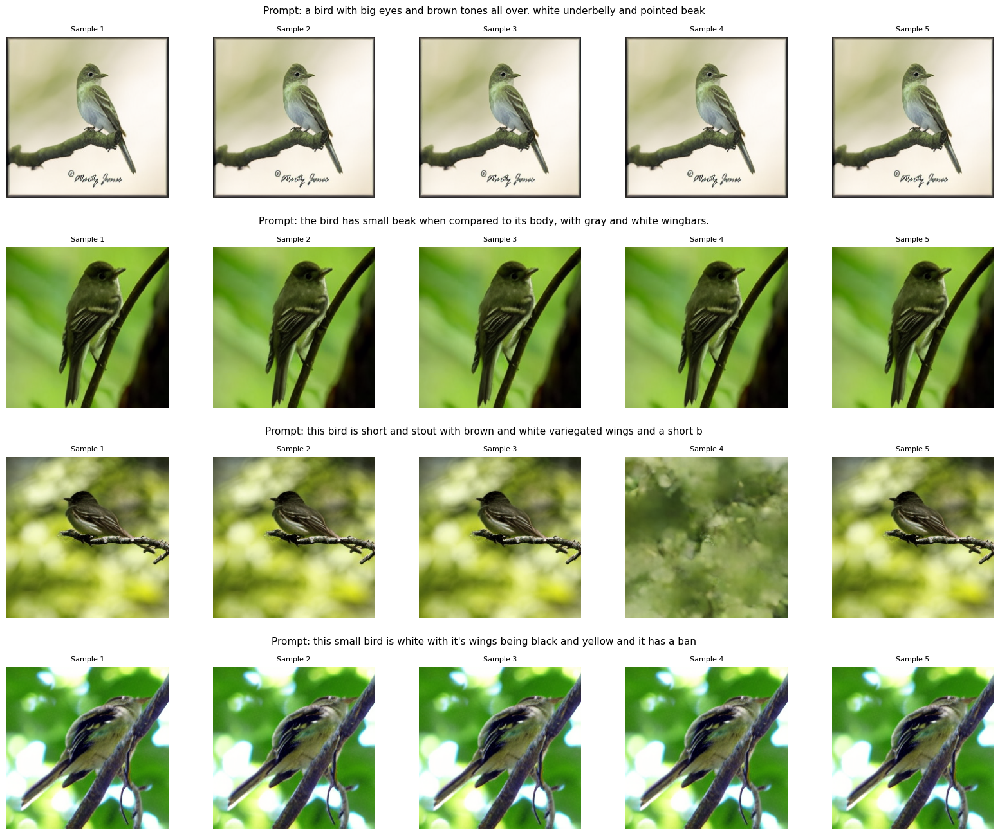

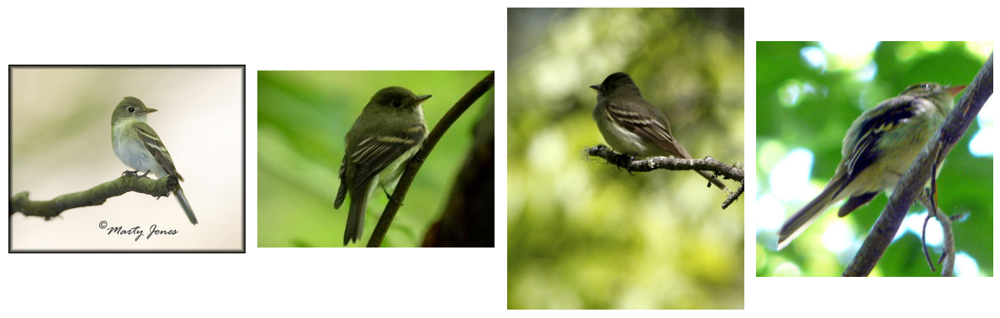

In [36]:
# Используем первые 4 промпта из датасета 
# (они точно есть в отладочном датасете)
prompts = ds['train']['text'][0:4]

if SAMPLE_IMAGES:
   vqvae = vqvae.eval().to(device)
   clip_model = clip_model.eval().to(device)
   model_cfg_dbg = model_cfg_dbg.eval().to(device)

   dbg_images, dbg_codes = generate_images_from_prompts(prompts, model_cfg_dbg, vqvae, clip_model, clip_processor, 
                                 num_samples_per_prompt=5, temperature=0.6, device=device)

   visualize_generated_images(dbg_images, prompts, num_cols=5)

# Для сравнения - реальные изображения с номерами 0, 1, 2 из датасета
if SAMPLE_IMAGES:
    img = ds['train']['image'][:4]
    fig, axs = plt.subplots(1, 4, figsize=(12, 4))
    for i in range(4):
        axs[i].imshow(img[i])
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

Посленяя строка изображений - оригиналы из датасета

#### Обучение на полном датасете

In [37]:
# Обучение. 200 эпох - 135 минут на A100
assert "vqvae" in locals() and vqvae is not None, "vqvae не задан"
assert "ds_codes_emb" in locals() and ds_codes_emb is not None, "ds_codes_emb не задан"
assert "clip_model" in locals() and clip_model is not None, "clip_model не задан"
assert "clip_processor" in locals() and clip_processor is not None, "clip_processor не задан"

# Создание DataLoader'ов
train_set, val_set = torch.utils.data.random_split(ds_codes_emb, [0.9, 0.1])
dataloaders = [
    DataLoader(train_set, batch_size=8, shuffle=True, num_workers=2, pin_memory=True, drop_last=True),
    DataLoader(val_set, batch_size=8, shuffle=False, num_workers=2, pin_memory=True),  # val
    DataLoader(train_set, batch_size=8, shuffle=False, num_workers=2, pin_memory=True),  # test
]
model_cfg_full, result_cfg_full = train_model(
    CFGConditionalPixelCNN,
    *dataloaders,
    model_name="cfg_full",
    epochs=200,
    c_hidden=256,
    condition_dim=512,
    cfg_dropout_prob=0.1,
)

test_res = result_cfg_full["test"][0]
print(
    "Test bits per dimension: %4.3fbpd"
    % (test_res["test_loss"] if "test_loss" in test_res else test_res["test_bpd"])
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model, loading...


Testing: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

Test bits per dimension: 9.538bpd


/tmp/ipykernel_85739/2670823425.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])


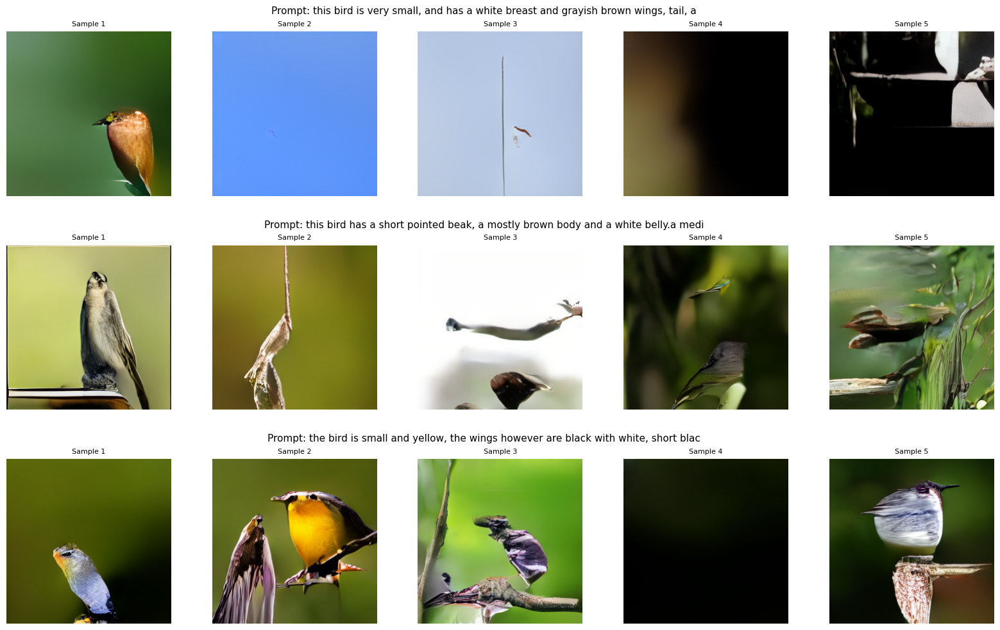

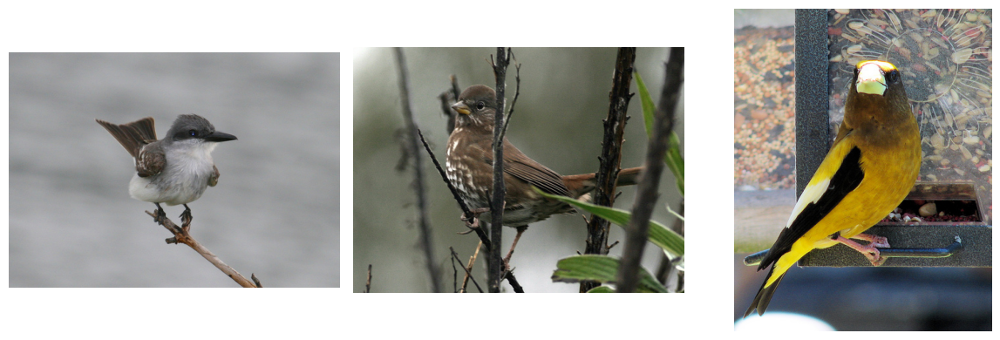

In [ ]:
if SAMPLE_IMAGES:
    random_indices = random.sample(range(len(ds['train'])), 3)
    prompts = [ds['train']['text'][i] for i in random_indices]

    vqvae = vqvae.eval().to(device)
    clip_model = clip_model.eval().to(device)
    model_cfg_full = model_cfg_full.eval().to(device)

    images_cf, codes_cf = generate_images_from_prompts(prompts, model_cfg_full, vqvae, clip_model, clip_processor, 
                                num_samples_per_prompt=5, temperature=0.7, device=device)

    visualize_generated_images(images_cf, prompts, num_cols=5)

# Для сравнения - реальные изображения с теми же номерами
if SAMPLE_IMAGES:
    fig, axs = plt.subplots(1, len(random_indices), figsize=(12, 4))
    for i, idx in enumerate(random_indices):
        axs[i].imshow(ds['train']['image'][idx])
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()


Последняя строка изображений - оригиналы, соответствующие промптам.

Очевидно, что модель что-то выучила.

### Задание 7 (0.5 балла)

Реализуйте какую-нибудь метрику качества генерации - на ваш выбор (это может быть Inception Score, Frechet Inception Distance, LPIPS или что-то другое). Вам необходимо привести работающий код для вычисления метрики и текстом пояснить как работает метрика.

Далее вычислите значение этой метрики для обученной в задании 5 модели и сделайте выводы.

In [39]:
# Воспользуемся метрикой LPIPS (Learned Perceptual Image Patch Similarity)

# Инициализация (используем AlexNet)
loss_fn_alex = lpips.LPIPS(net='alex').to(device)
loss_fn_alex.eval()

def calculate_lpips(real_images, gen_images, loss_fn, batch_size=8):
    """
    Вычисляет LPIPS между реальными и сгенерированными изображениями
    
    Args:
        real_images: torch.Tensor [N, 3, H, W] - реальные изображения в диапазоне [0, 1]
        gen_images: torch.Tensor [N, 3, H, W] - сгенерированные изображения в диапазоне [0, 1]
        loss_fn: LPIPS модель
        batch_size: размер батча для обработки
    
    Returns:
        lpips_score: среднее значение LPIPS
        lpips_scores: список LPIPS для каждой пары изображений
    """
    assert len(real_images) == len(gen_images), "Количество изображений должно совпадать"
    
    # LPIPS ожидает изображения в диапазоне [-1, 1]
    real_images = real_images * 2 - 1
    gen_images = gen_images * 2 - 1
    
    lpips_scores = []
    
    with torch.no_grad():
        for i in tqdm(range(0, len(real_images), batch_size), desc="Вычисление LPIPS"):
            batch_real = real_images[i:i+batch_size].to(device)
            batch_gen = gen_images[i:i+batch_size].to(device)
            
            # Вычисляем LPIPS для батча
            dist = loss_fn(batch_real, batch_gen)
            lpips_scores.extend(dist.cpu().numpy().flatten())
    
    lpips_score = np.mean(lpips_scores)
    return lpips_score, lpips_scores

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/yc-user/GM-HSE-AI-masters-course/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/yc-user/GM-HSE-AI-masters-course/.venv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/yc-user/GM-HSE-AI-masters-course/.venv/lib/python3.12/site-packages/lpips/weights/v0.1/alex.pth


In [ ]:
# Вычисление LPIPS для модели
def evaluate_model(model_to_eval, vqvae, clip_model, clip_processor, ds, device, model_name="ConditionalPixelCNN (задание 5)"):

    print(f"Оценка модели: {model_name}")

    # Параметры для генерации
    NUM_SAMPLES = 50  # Количество изображений для оценки (можно увеличить для более точной оценки)
    TEMPERATURE = 0.8  # Температура для генерации

    # Подготовка: берем промпты из датасета
    print(f"Подготовка {NUM_SAMPLES} промптов из датасета...")
    # Берем промпты равномерно по датасету
    indices = np.linspace(0, len(ds['train']) - 1, NUM_SAMPLES, dtype=int)
    prompts_for_eval = [ds['train'][i]['text'] for i in indices]

    # Генерация изображений
    print(f"Генерация {NUM_SAMPLES} изображений...")
    model_to_eval = model_to_eval.eval().to(device)
    vqvae = vqvae.eval().to(device)
    clip_model = clip_model.eval().to(device)

    gen_images_list = []
    real_images_list = []

    with torch.no_grad():
        for i, prompt in enumerate(tqdm(prompts_for_eval, desc="Генерация")):
            # Генерируем изображение
            text_emb = text_to_embedding([prompt], clip_model, clip_processor, device)
            codes = model_to_eval.sample(
                shape=(32, 32),
                num_samples=1,
                condition=text_emb,
                temperature=TEMPERATURE
            )
            gen_image = codes_to_img(codes, vqvae)[0]  # [3, 256, 256]
            gen_images_list.append(gen_image.cpu())
            
            # Берем соответствующее реальное изображение
            real_img = ds['train'][indices[i]]['image']
            # Конвертируем PIL в тензор [3, 256, 256] в диапазоне [0, 1]
            real_tensor = preprocess_image(real_img)  # [3, 256, 256]
            real_images_list.append(real_tensor)

    # Объединяем в тензоры
    gen_images = torch.stack(gen_images_list)  # [NUM_SAMPLES, 3, 256, 256]
    real_images = torch.stack(real_images_list)  # [NUM_SAMPLES, 3, 256, 256]

    print("Вычисление LPIPS ...")

    lpips_score, lpips_scores = calculate_lpips(
        real_images, 
        gen_images, 
        loss_fn_alex, 
        batch_size=8
    )

    print("\nРЕЗУЛЬТАТЫ ОЦЕНКИ МОДЕЛИ")
    print(f"Модель: {model_name}")
    print(f"Количество изображений: {NUM_SAMPLES}")
    print(f"Температура генерации: {TEMPERATURE}")
    print(f"\nLPIPS Score: {lpips_score:.4f}")
    print(f"Стандартное отклонение: {np.std(lpips_scores):.4f}")
    print(f"Минимум: {np.min(lpips_scores):.4f}")
    print(f"Максимум: {np.max(lpips_scores):.4f}")

    if lpips_score < 0.1:
        print("Отлично! LPIPS < 0.1 - изображения очень похожи на реальные")
    elif lpips_score < 0.3:
        print("Хорошо! LPIPS < 0.3 - изображения похожи на реальные")
    elif lpips_score < 0.5:
        print("Умеренно. LPIPS 0.3-0.5 - есть сходство, но есть и различия")
    else:
        print("Плохо. LPIPS > 0.5 - изображения заметно отличаются от реальных")


In [41]:
# Проверяем наличие необходимых переменных
assert 'model_cf' in locals(), "Модель из задания 5 не найдена. Перезапустить Задание 5."
assert 'vqvae' in locals(), "VQ-VAE не найден"
assert 'clip_model' in locals(), "CLIP модель не найдена"
assert 'clip_processor' in locals(), "CLIP processor не найден"
assert 'ds' in locals(), "Исходный датасет не найден"

if SAMPLE_IMAGES:
    evaluate_model(model_cf, vqvae, clip_model, clip_processor, ds, device, model_name="ConditionalPixelCNN (задание 5)")
else:
    print("Долгие операции отключены")

Оценка модели: ConditionalPixelCNN (задание 5)
Подготовка 50 промптов из датасета...
Генерация 50 изображений...


Генерация:   0%|          | 0/50 [00:00<?, ?it/s]

Вычисление LPIPS ...


Вычисление LPIPS:   0%|          | 0/7 [00:00<?, ?it/s]


РЕЗУЛЬТАТЫ ОЦЕНКИ МОДЕЛИ
Модель: ConditionalPixelCNN (задание 5)
Количество изображений: 50
Температура генерации: 0.8

LPIPS Score: 0.7520
Стандартное отклонение: 0.0917
Минимум: 0.5233
Максимум: 0.9044
Плохо. LPIPS > 0.5 - изображения заметно отличаются от реальных


#### Выводы

LPIPS - это метрика для оценки сходства между изображениями.

Как работает LPIPS:
1. Изображения пропускаются через предобученную CNN (VGG/AlexNet)
2. Извлекаются активации из промежуточных слоев (фичи)
3. Вычисляется L2 расстояние между фичами реальных и сгенерированных изображений
4. Результат усредняется по всем слоям и патчам

Преимущества LPIPS:
- Учитывает "перцептуальное" сходство (как видит человек)
- Более устойчива к небольшим изменениям, чем пиксельные метрики
- Хорошо коррелирует с человеческим восприятием
- Меньше - лучше (0 = идентичные изображения, обычно < 0.3 - хорошо, > 0.5 - плохо)

**Результат**
| Метрика                 | Значение   |
|-------------------------|-----------|
| LPIPS Score             | 0.7520    |
| Стандартное отклонение  | 0.0917    |
| Минимум                 | 0.5233    |
| Максимум                | 0.9044    |

Модель плохо воспроизводит перцептуальные характеристики реальных изображений :(
    
Хотя приятно уже то, что:
1. иногда мы видим отдельные фрагменты или даже очертания птиц.
2. эти фрагменты или очертания иногда повторяют цвета, текстуры и даже формы того что в оригинале соответствовало промпту.

### Задание 8 (0.5 балла).

Можете делать любые действия для улучшения работы вашей модели (менять число слоев, параметры архитектуры - не отходя от концепции PixelCNN, менять гиперпараметры, делать аугментацию изображений и текстов и так далее).

Проведите эксперименты по улучшению качества модели - оценивайте качество модели с точки зрения:
- Реализованной в задании 7 метрики
- Визуально.

Мы ожидаем, что качество может не вырасти, но и не упадет.

**Идея:**  
Поскольку текстовое описание изображения (в датасете ds) состоит из нескольких предложений, можно разделить их на отдельные тексты (по символу ".") и использовать как разные примеры описаний одного изображения. Это увеличит размер датасета и разнообразие обучающих примеров.
Далее обучить модель CFGConditionalPixelCNN.

In [42]:
# ваш код здесь
ds['train'][0]['text'].split(".")

['a bird with big eyes and brown tones all over',
 ' white underbelly and pointed beaka very small bird whose entire coat is covered with varying shades of green',
 'this bird is brown with white on its chest and has a very short beak',
 'this small bird has grey wingbars with a white belly',
 'this light brown and yellow bird features large black eyes and a small beak',
 'small grey green and brown bird with medium black tarsus and medium beakthis bird has wings that are green and black and has a white bodythis bird has wings that are black and white and has a green headthis bird has wings that are grey and has a white bellythis bird is brown and white in color, and has a brown beak',
 '']

#### Подготовка расширенного датасета

In [43]:
def create_sentence_split_embeddings(dataset, clip_model, clip_processor, device, 
                                     save_path=None, rebuild=False):
    """
    Создает эмбеддинги для каждого предложения в текстовых описаниях.
    Разделяет тексты по точке "." и создает отдельный эмбеддинг для каждого предложения.
    
    Returns:
        all_codes_expanded: torch.Tensor [N_expanded, 32, 32] - codes, повторенные для каждого предложения
        all_embeddings_expanded: torch.Tensor [N_expanded, 512] - эмбеддинги для каждого предложения
        sentence_to_image_idx: List[int] - маппинг от индекса предложения к индексу исходного изображения
    """
    if save_path and Path(save_path).exists() and not rebuild:
        print(f"Загружаем расширенные эмбеддинги из {save_path}")
        data = torch.load(save_path)
        return data['codes'], data['embeddings'], data['mapping']
    
    print("Создание расширенных эмбеддингов (разделение по предложениям)...")
    
    # Загружаем существующие codes
    if not (Path(DATA_PATH) / "all_codes.pt").exists():
        raise FileNotFoundError("Сначала нужно создать codes (Задание 3)")
    all_codes = torch.load(Path(DATA_PATH) / "all_codes.pt")
    
    expanded_embeddings = []
    expanded_codes = []
    sentence_to_image_idx = []
    
    clip_model.eval()
    with torch.no_grad():
        for img_idx in tqdm(range(len(dataset)), desc="Обработка изображений"):
            # Получаем текст для изображения
            text = dataset[img_idx]['text']
            
            # Разделяем по точке ".", берем только длиннее 10 символов
            sentences = [s.strip().lower() for s in text.split(".") if s.strip() and len(s.strip()) > 10]
            
            # Если нет разбиений, то берем весь текст
            if len(sentences) == 0:
                sentences = [text]
            
            # Создаем эмбеддинг для каждого предложения
            for sentence in sentences:
                inputs = clip_processor(text=[sentence], return_tensors="pt", 
                                       padding=True, truncation=True)
                inputs = {k: v.to(device) for k, v in inputs.items()}
                text_features = clip_model.get_text_features(**inputs)
                
                expanded_embeddings.append(text_features.cpu())
                expanded_codes.append(all_codes[img_idx])  # один и тот же codes для всех предложений
                sentence_to_image_idx.append(img_idx)  # один номер изображения для всех предложений
    
    # Объединяем в тензоры
    all_codes_expanded = torch.stack(expanded_codes)  # [N_expanded, 32, 32]
    all_embeddings_expanded = torch.cat(expanded_embeddings, dim=0)  # [N_expanded, 512]
    
    print(f"Исходный размер датасета: {len(dataset)}")
    print(f"Расширенный размер датасета: {len(all_codes_expanded)}")
    
    # Сохраняем
    if save_path:
        data = {
            'codes': all_codes_expanded,
            'embeddings': all_embeddings_expanded,
            'mapping': sentence_to_image_idx
        }
        torch.save(data, save_path)
        print(f"Расширенные эмбеддинги сохранены в {save_path}")
    
    return all_codes_expanded, all_embeddings_expanded, sentence_to_image_idx

In [44]:
# Создание расширенного датасета
all_codes_expanded, all_embeddings_expanded, sentence_mapping = create_sentence_split_embeddings(
    ds['train'],
    clip_model,
    clip_processor,
    device,
    save_path=(Path(DATA_PATH) / "clip_text_embeddings_split.pt"),
    rebuild=False  # установить True для пересоздания
)

# Создаем новый датасет
ds_codes_emb_expanded = torch.utils.data.StackDataset(
    all_codes_expanded, 
    all_embeddings_expanded
)

print(f"Размер расширенного датасета: {len(ds_codes_emb_expanded)}")


Загружаем расширенные эмбеддинги из data/clip_text_embeddings_split.pt
Размер расширенного датасета: 95797


In [45]:
# Создаем отладочный датасет (первые 15 изображений, но со всеми их предложениями)
debug_indices = [i for i, img_idx in enumerate(sentence_mapping) if img_idx < 15]
ds_codes_emb_expanded_debug = torch.utils.data.Subset(
    ds_codes_emb_expanded, 
    debug_indices
)
print(f"Размер отладочного расширенного датасета: {len(ds_codes_emb_expanded_debug)}")

Размер отладочного расширенного датасета: 119


#### Обучение на датасете

Попробовал на отладочном датасете:
- всего 15 первых птиц, всего 119 записей в датасете (после разбиение тектов), но получилось плохл.

Попробую сразу на всем - на удачу! Идея улучшения вроде хорошая...

In [46]:
# Обучение CFGConditionalPixelCNN на расширенном датасете (415 мин на А100)
train_set_exp, val_set_exp = torch.utils.data.random_split(
    ds_codes_emb_expanded, 
    [0.9, 0.1]
)

dataloaders_exp = [
    DataLoader(train_set_exp, batch_size=16, shuffle=False, num_workers=2, pin_memory=True, drop_last=True),
    DataLoader(val_set_exp, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),
    DataLoader(train_set_exp, batch_size=16, shuffle=False, num_workers=2, pin_memory=True),
]

model_cfg_exp, result_cfg_exp = train_model(
    CFGConditionalPixelCNN,
    *dataloaders_exp,
    model_name="cfg_exp",
    epochs=110,
    c_hidden=256,
    condition_dim=512,
    cfg_dropout_prob=0.1,
)

test_res = result_cfg_exp["test"][0]
print(
    "Test bits per dimension: %4.3fbpd"
    % (test_res["test_loss"] if "test_loss" in test_res else test_res["test_bpd"])
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Found pretrained model, loading...


Testing: |          | 0/? [00:00<?, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

Test bits per dimension: 10.585bpd


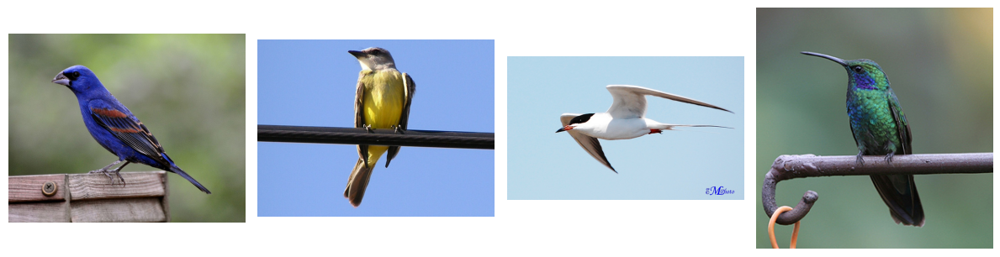

[
    'a bright blue bird with a squat, fat lavender bill, lavender tarsus and feet, and white and gold accents on 
its wings',
    'the bird has a yellow body and white had with black bill',
    'the big bat winged white bird has a long distinct orange beak with black and white wingsa white bird with a 
black crown and an orange and black bill',
    'a bird with a very long pointed bill, blue cheek patch, green throat, and pearlescent blue-green breast'
]

In [47]:
# Для сравнения - реальные изображения из датасета
random_indices =[1290, 10339, 3139, 4861]
# random_indices = random.sample(range(len(ds['train'])), 4)
if SAMPLE_IMAGES:
    img = ds['train']['image'][random_indices]
    fig, axs = plt.subplots(1, 4, figsize=(12, 4))
    for i in range(4):
        axs[i].imshow(img[i])
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

prompts = [t.split(".")[0] for t in ds['train']['text'][random_indices]]
rprint(prompts)

/tmp/ipykernel_85739/2670823425.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])


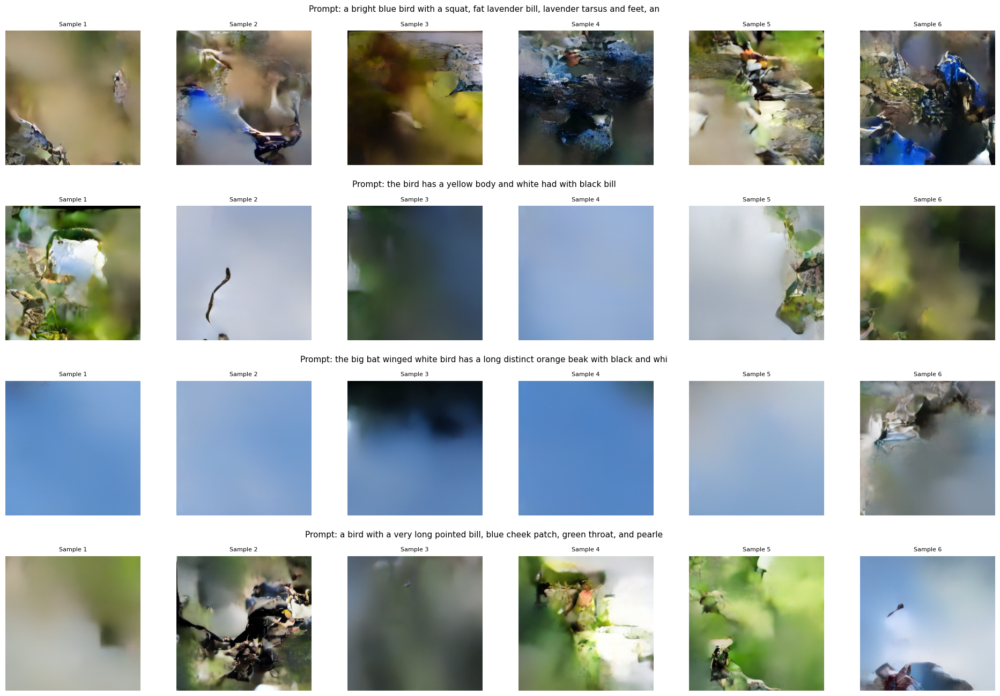

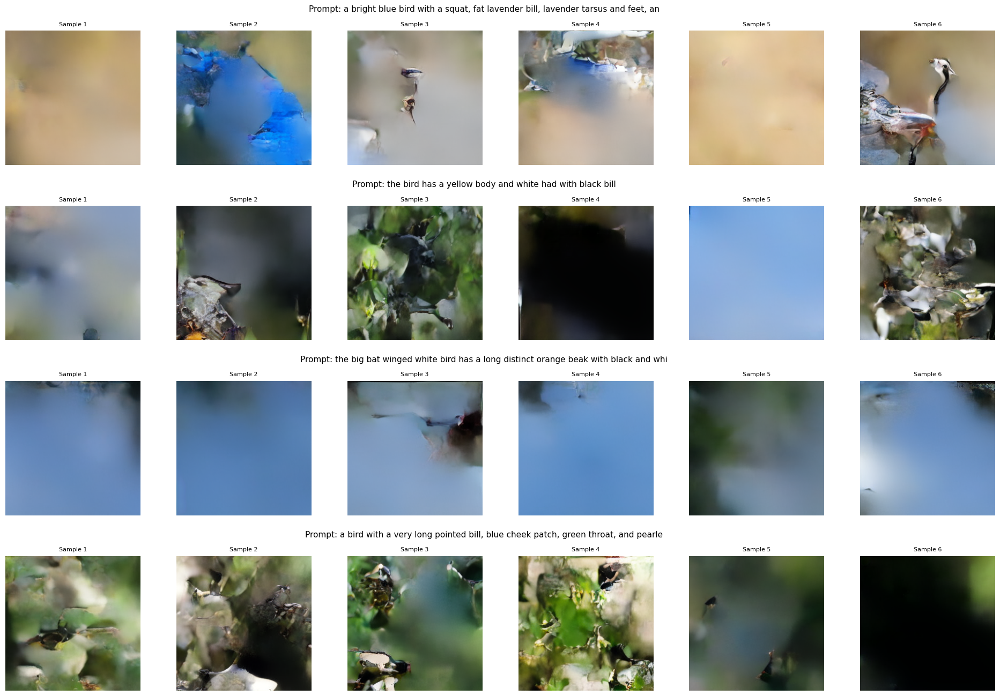

In [48]:
# Используем первые предложения из 4 промптов из датасета 

if SAMPLE_IMAGES:
   vqvae = vqvae.eval().to(device)
   clip_model = clip_model.eval().to(device)
#    model_cfg_exp_dbg = model_cfg_dbg.eval().to(device)
   model_cfg_exp = model_cfg_exp.eval().to(device)

   t_list = [0.85, 0.87]
   n_samples = 6

   for t in t_list:
#    dbg_images, dbg_codes = generate_images_from_prompts(prompts, model_cfg_exp_dbg, vqvae, clip_model, clip_processor, 
      dbg_images, dbg_codes = generate_images_from_prompts(prompts, model_cfg_exp, vqvae, clip_model, clip_processor, 
                                 num_samples_per_prompt=n_samples, temperature=t, device=device)

      visualize_generated_images(dbg_images, prompts, num_cols=n_samples)


#### Оценка модели метрикой LPIPS

In [49]:
# Проверяем наличие необходимых переменных
assert 'model_cfg_exp' in locals(), "Модель из задания 5 не найдена. Перезапустить Задание 8."
assert 'vqvae' in locals(), "VQ-VAE не найден"
assert 'clip_model' in locals(), "CLIP модель не найдена"
assert 'clip_processor' in locals(), "CLIP processor не найден"
assert 'ds' in locals(), "Исходный датасет не найден"

if SAMPLE_IMAGES:
    evaluate_model(model_cfg_exp, vqvae, clip_model, clip_processor, ds, device, model_name="CFGConditionalPixelCNN (задание 8)")
else:
    print("Долгие операции отключены")

Оценка модели: CFGConditionalPixelCNN (задание 8)
Подготовка 50 промптов из датасета...
Генерация 50 изображений...


Генерация:   0%|          | 0/50 [00:00<?, ?it/s]

Вычисление LPIPS ...


Вычисление LPIPS:   0%|          | 0/7 [00:00<?, ?it/s]


РЕЗУЛЬТАТЫ ОЦЕНКИ МОДЕЛИ
Модель: CFGConditionalPixelCNN (задание 8)
Количество изображений: 50
Температура генерации: 0.8

LPIPS Score: 0.8171
Стандартное отклонение: 0.1207
Минимум: 0.4831
Максимум: 1.0549
Плохо. LPIPS > 0.5 - изображения заметно отличаются от реальных


#### Вывод

| Метрика                | Значение   |
|------------------------|-----------|
| LPIPS Score            | 0.8171    |
| Стандартное отклонение | 0.1207    |
| Минимум                | 0.4831    |
| Максимум               | 1.0549    |

LPIPS > 0.5 - изображения заметно отличаются от реальных.

Более того, LPIPS Score даже хуже, чем в Задании 7 (0.7520), то есть эксперимент по расширению датасета можно назвать неудачным.
    
Минимальное значение метрики 0.4831 - это интересно, т.е. иногда изображения получались более-менее похожие, однако, поймать их для визуализации мне не удалось.
Иногда мы видим отдельные фрагменты птиц и эти фрагменты иногда повторяют цвета, текстуры и даже формы того что в оригинале соответствовало промпту.

### Задание 9 (1.5 балла).

Проанализируйте лучшую модель:

- Придумайте 5 разных признаков (например, цвет, вид оперения, длина клюва, лап и так далее) и посмотрите, будет ли модель их понимать благодаря текстовому эмбеддингу? (0.5 балла)

- Попробуйте добавлять в модель другие промпты - не связанные с птицами, или по-другому построенные (не "a photo of", а по-другому сформулированные). Как отрабатывает модель? (0.5 балла)

- Фиксируйте удачный промпт и проведите эксперименты по изменению веса guidance в classifer-free подходе. Сделайте выводы. (0.5 балла)

На это задание не хватило времени

In [50]:
# ваш код здесь
